In [1]:
import pandas as pd
import os
import glob
import json

base_dirs = [
    "results_all_selected_patients_w1-10_N",
    "results_all_selected_patients_LSTM",
    "results_all_selected_patients_TCN",
    "results_all_selected_patients_MLP"
]

all_rows = []

for base_dir in base_dirs:
    csv_files = glob.glob(os.path.join(base_dir, "*.csv"))

    for file in csv_files:
        df = pd.read_csv(file)

        # infer method from folder name
        if "LSTM" in base_dir:
            df["Method"] = "LSTM"
        elif "TCN" in base_dir:
            df["Method"] = "TCN"
        elif "MLP" in base_dir:
            df["Method"] = "MLP"
        else:
            df["Method"] = "DynML"

        all_rows.append(df)

df_all = pd.concat(all_rows, ignore_index=True)

print(df_all.shape)
df_all.head()

(121195, 26)


,Patient,Data_seed,Reservoir_seed,input_len,Pred_len,N,Train_MSE,Train_r,Train_RMSE,Avg_Topological_Entropy,...,Test_RMSE,Test_Entropy,Param_Means,Param_Stds,Online_results,Method,batch_size,hidden_dim,Epochs,Learning_rate
0,106,17,2456,10,1,5.0,0.002093,0.984330,0.043290,0.043760,...,0.307743,0.044194,"[0.1994570229291111, 0.1945000289899584, 5.687...","[0.011955173531573828, 0.01142406459702858, 0....","[{""time"": 10, ""accuracy"": 0.78, ""precision"": 0...",DynML,NaN,NaN,NaN,NaN
1,106,17,2456,10,10,5.0,0.062268,0.318728,0.238643,0.043779,...,6.626638,0.044039,"[0.1994570229291111, 0.1945000289899584, 5.687...","[0.011955173531573828, 0.01142406459702858, 0....","[{""time"": 10, ""accuracy"": 0.745, ""precision"": ...",DynML,NaN,NaN,NaN,NaN
2,209,17,1388,40,1,20.0,0.003816,0.914710,0.058453,0.045971,...,2.013624,0.045972,"[0.19372693229125923, 0.19988521156964162, 5.6...","[0.009607364715822454, 0.012854961811685002, 0...","[{""time"": 40, ""accuracy"": 0.685, ""precision"": ...",DynML,NaN,NaN,NaN,NaN
3,209,17,1388,40,10,20.0,0.019680,0.331036,0.138541,0.045958,...,1.150873,0.045963,"[0.19372693229125923, 0.19988521156964162, 5.6...","[0.009607364715822454, 0.012854961811685002, 0...","[{""time"": 40, ""accuracy"": 0.64, ""precision"": 0...",DynML,NaN,NaN,NaN,NaN
4,106,17,1523,30,1,35.0,0.002756,0.984004,0.048017,0.046048,...,465.107792,0.048700,"[0.19886634302910092, 0.19650335157614263, 5.7...","[0.010067154084138897, 0.010622378622336568, 0...","[{""time"": 30, ""accuracy"": 0.82, ""precision"": 0...",DynML,NaN,NaN,NaN,NaN


In [1]:
import pandas as pd
import os
import glob
import json

# # Save the raw data
# df_all.to_pickle("multimethod_raw_data.pkl")

# Load the data
df_all = pd.read_pickle("multimethod_raw_data.pkl")


In [2]:
print("===== METHOD COUNTS =====")
print(df_all["Method"].value_counts(dropna=False))

print("\n===== DynML CHECK =====")
dynml_df = df_all[df_all["Method"] == "DynML"]

print("DynML rows:", len(dynml_df))

print("\nDynML preview:")
print(dynml_df.head())

print("\nDynML input_len distribution:")
print(dynml_df["input_len"].value_counts(dropna=False))

===== METHOD COUNTS =====
Method
LSTM     51048
TCN      34048
DynML    18998
MLP      17101
Name: count, dtype: int64

===== DynML CHECK =====
DynML rows: 18998

DynML preview:
   Patient  Data_seed  Reservoir_seed  input_len  Pred_len     N  Train_MSE  \
0      106         17            2456         10         1   5.0   0.002093   
1      106         17            2456         10        10   5.0   0.062268   
2      209         17            1388         40         1  20.0   0.003816   
3      209         17            1388         40        10  20.0   0.019680   
4      106         17            1523         30         1  35.0   0.002756   

    Train_r  Train_RMSE  Avg_Topological_Entropy  ...   Test_RMSE  \
0  0.984330    0.043290                 0.043760  ...    0.307743   
1  0.318728    0.238643                 0.043779  ...    6.626638   
2  0.914710    0.058453                 0.045971  ...    2.013624   
3  0.331036    0.138541                 0.045958  ...    1.150873   
4 

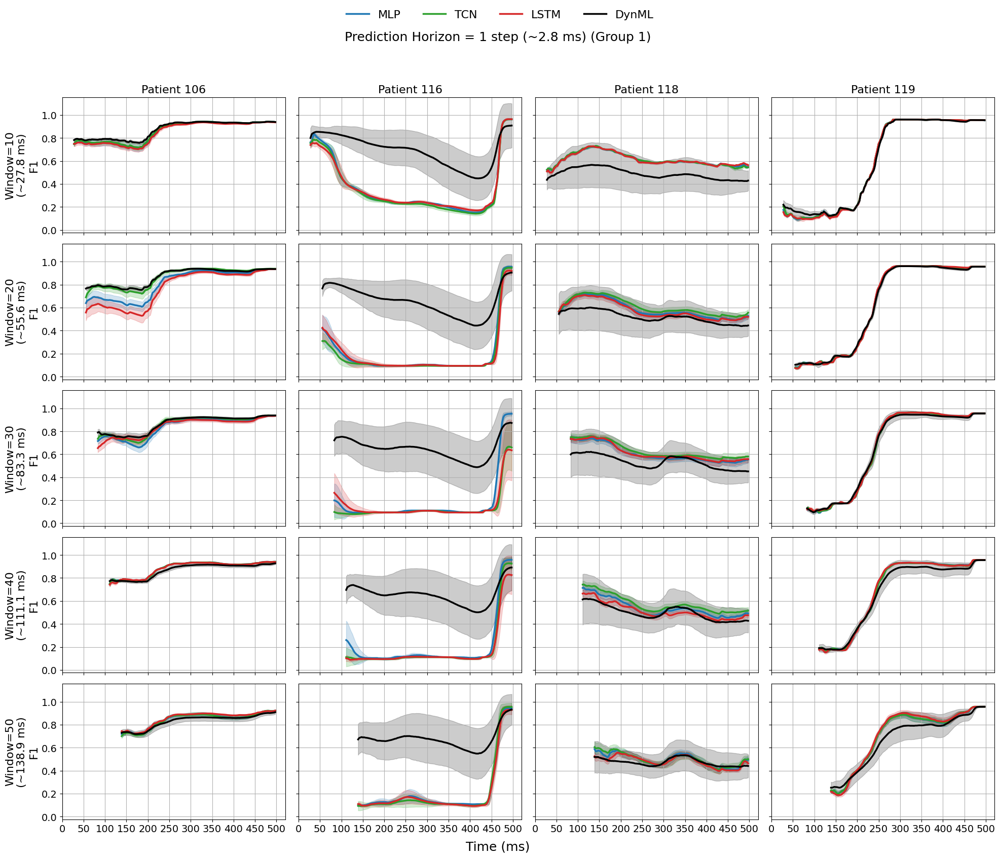

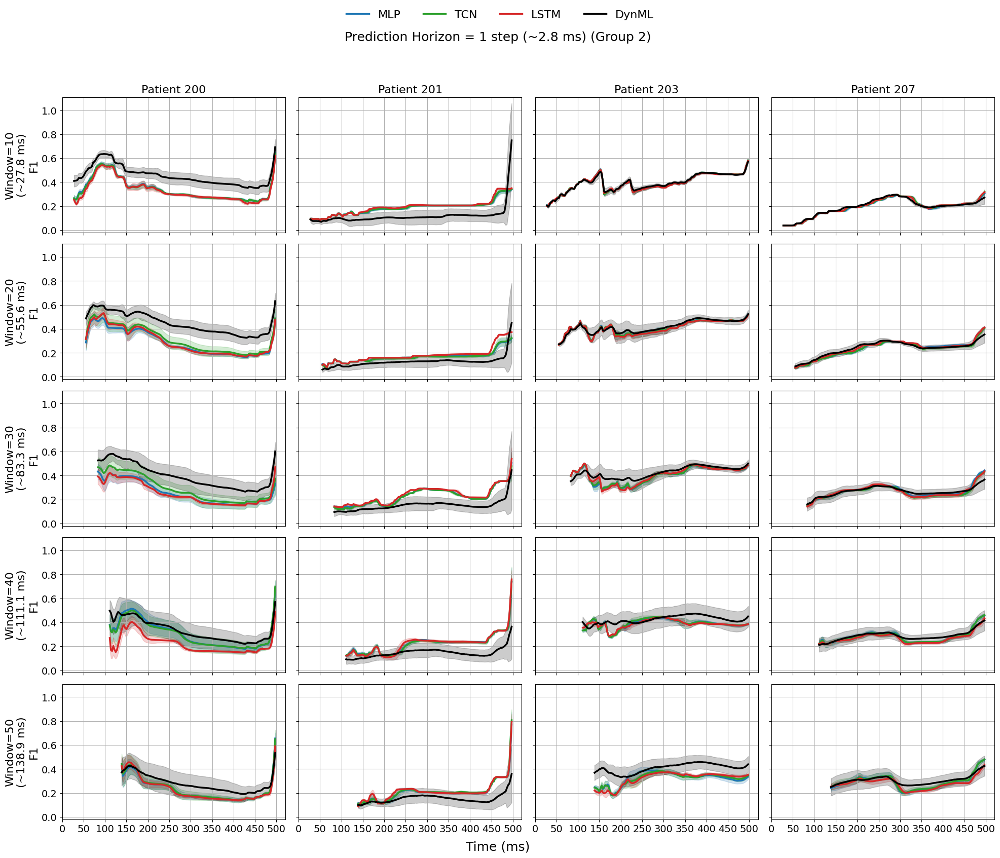

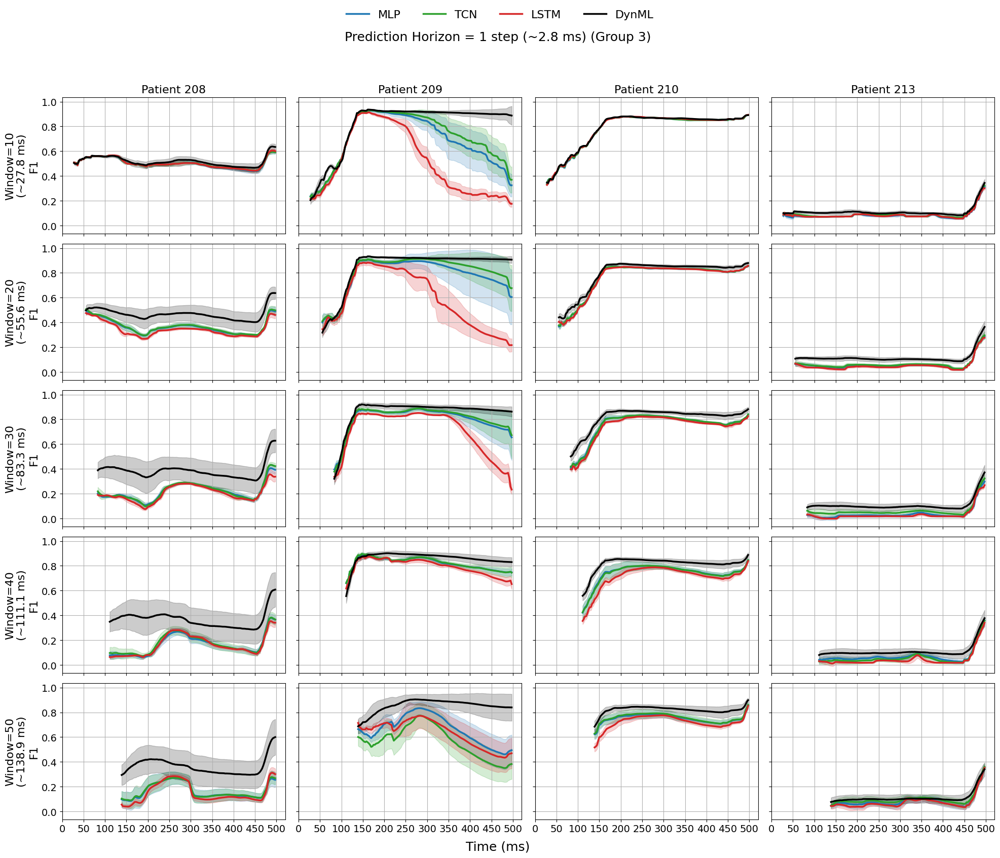

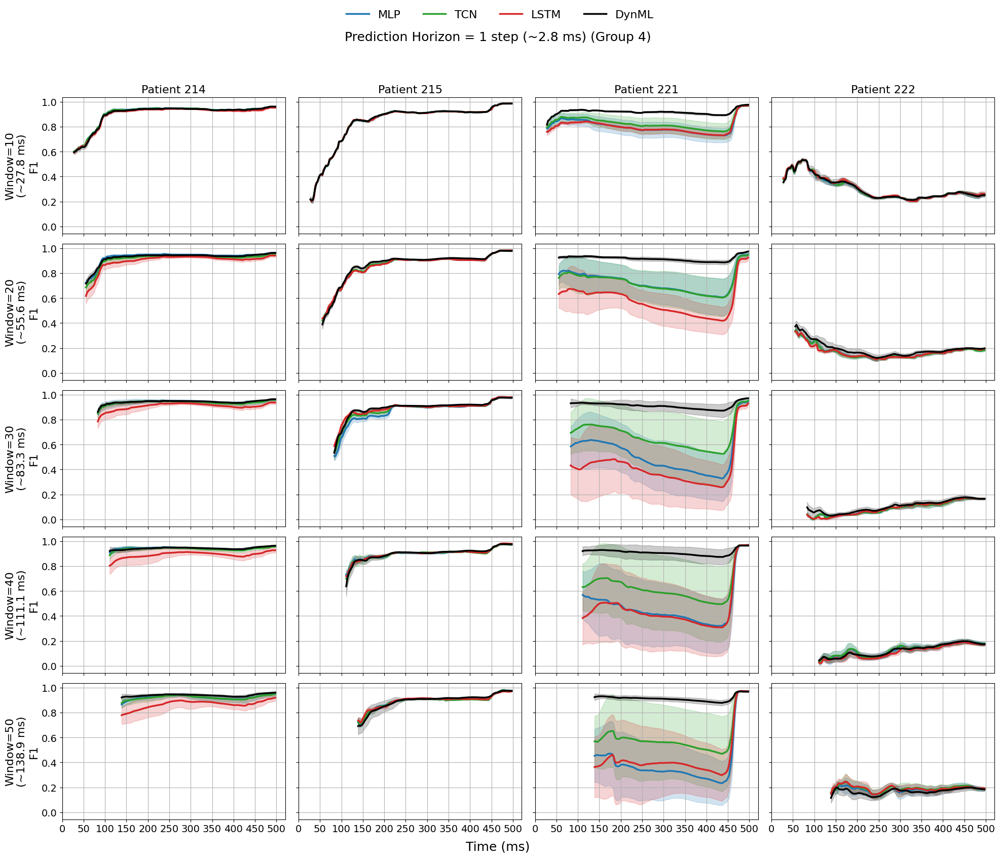

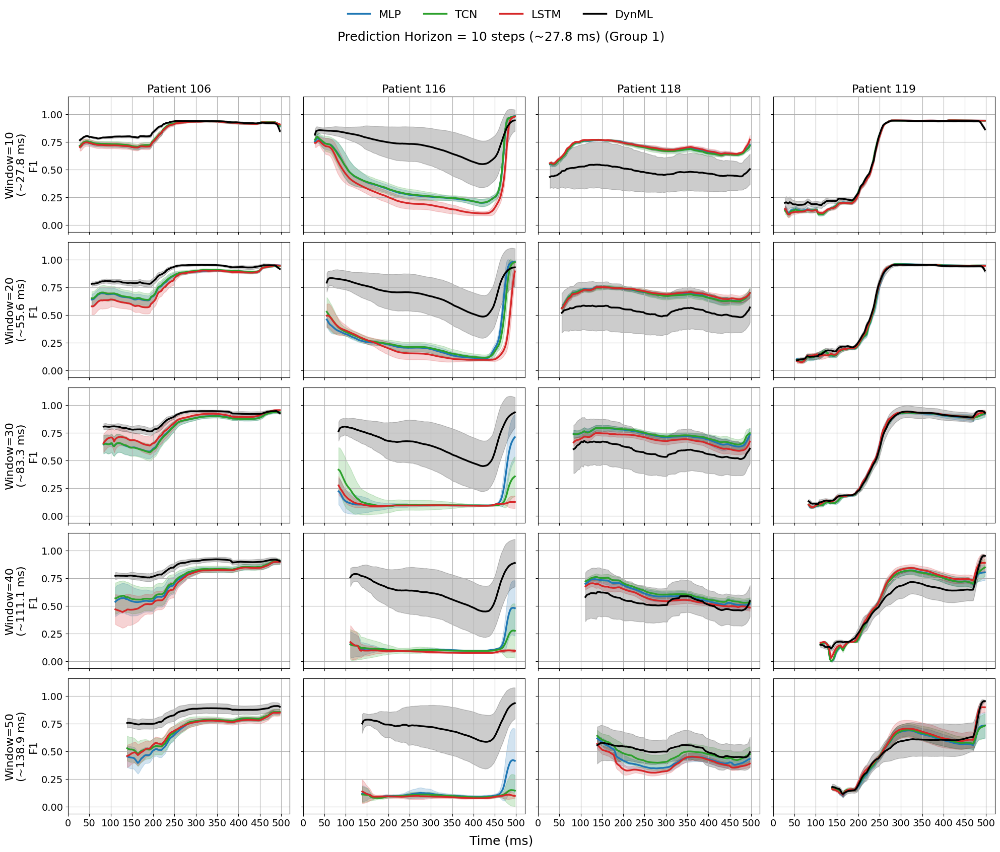

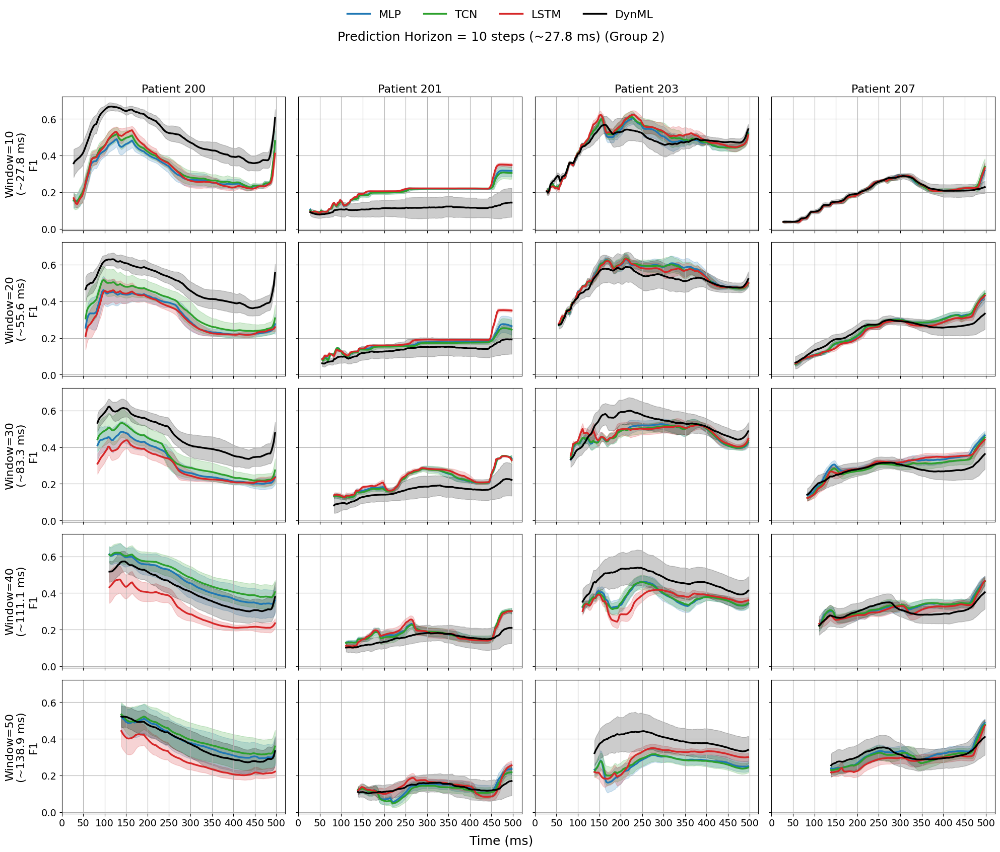

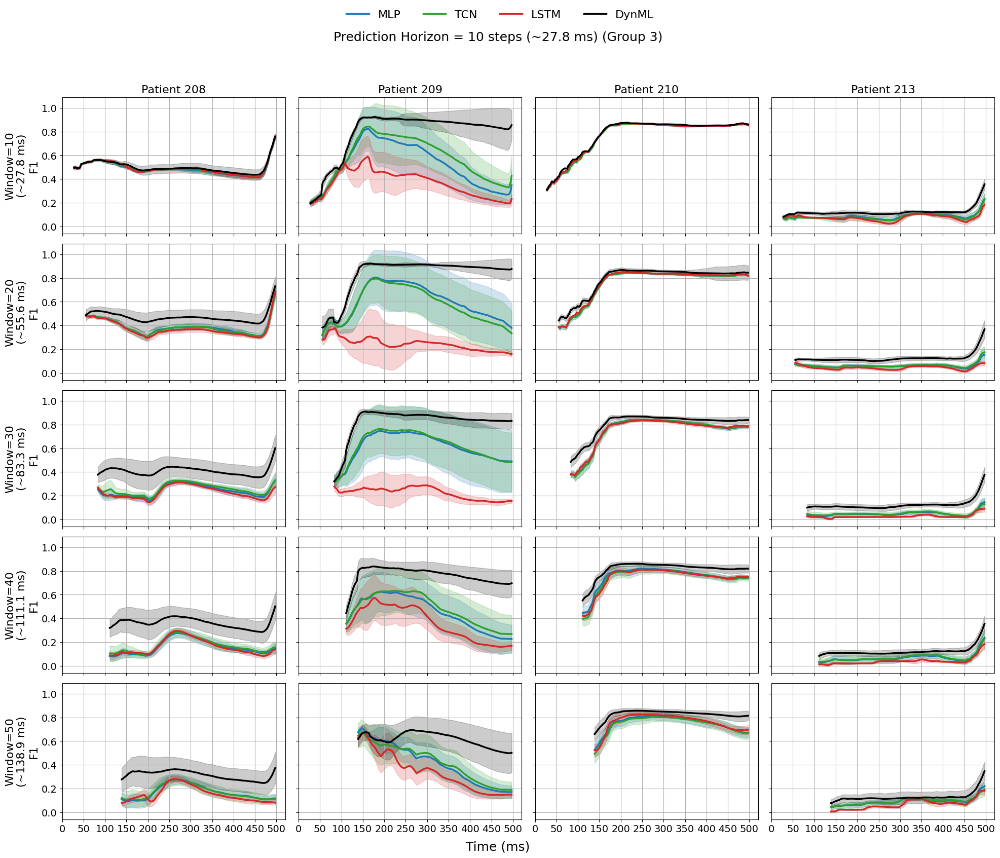

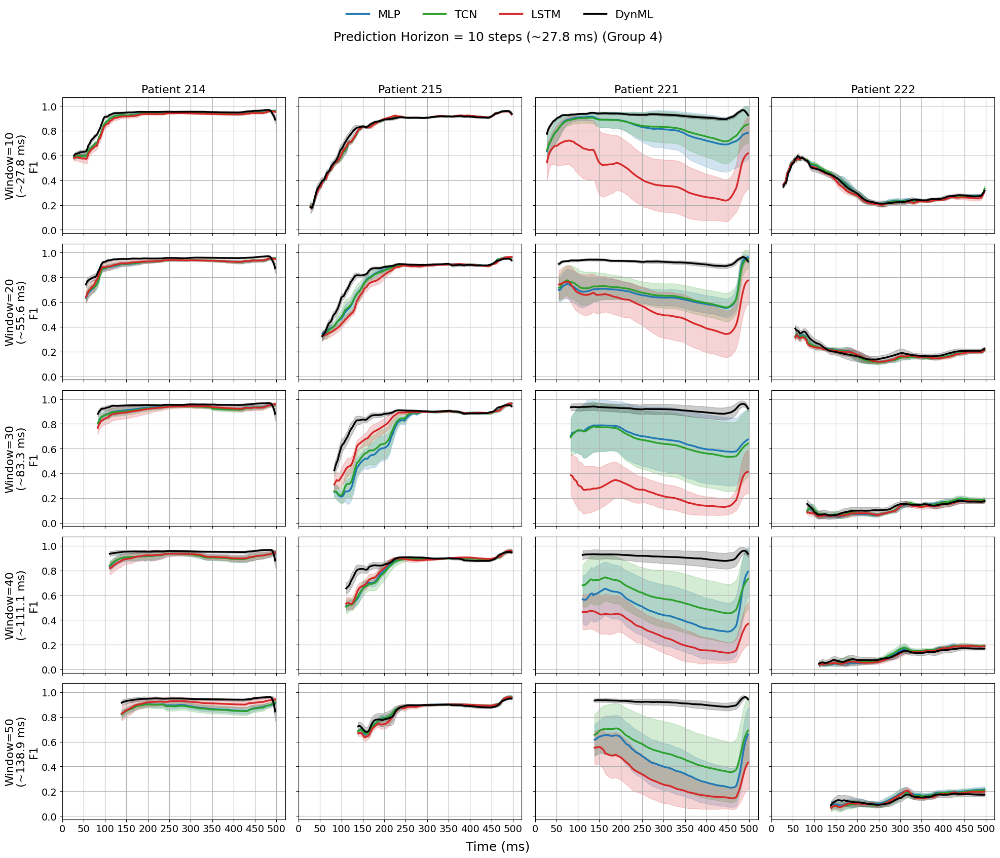

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import json

# ==========================================================
# CONFIG
# ==========================================================
methods = ["MLP", "TCN", "LSTM", "DynML"]

colors = {
    "MLP": "tab:blue",
    "TCN": "tab:green",
    "LSTM": "tab:red",
    "DynML": "black"
}

dt_ms = 1000 / 360

patients = sorted(df_all["Patient"].unique())
windows_list = sorted(df_all["input_len"].unique())

# ==========================================================
# FUNCTION TO EXTRACT MATRIX
# ==========================================================
def extract_f1_matrix(df):
    f1_matrix = []

    for _, row in df.iterrows():
        try:
            res = json.loads(row["Online_results"])
            f1_vec = np.array([r["f1"] for r in res])
            f1_matrix.append(f1_vec)
        except:
            continue

    if len(f1_matrix) == 0:
        return None

    min_len = min(len(x) for x in f1_matrix)
    f1_matrix = np.array([x[:min_len] for x in f1_matrix])

    return f1_matrix

# ==========================================================
# SPLIT BY PREDICTION LENGTH
# ==========================================================
df_pred1  = df_all[df_all["Pred_len"] == 1]
df_pred10 = df_all[df_all["Pred_len"] == 10]

# ==========================================================
# FUNCTION TO PLOT
# ==========================================================
def plot_by_pred(df_use, title):

    os.makedirs("multimethods_figures", exist_ok=True)
    x_max_ms = 500  # adjust if needed
    x_ticks_ms = np.arange(0, x_max_ms + 1, 50)

    patient_groups = [patients[i:i+4] for i in range(0, len(patients), 4)]

    # for g, patient_group in enumerate(patient_groups):
    for g, patient_group in enumerate(patient_groups[:4]):

        fig, axes = plt.subplots(
            nrows=len(windows_list),
            ncols=len(patient_group),
            figsize=(5 * len(patient_group), 3.5 * len(windows_list)),
            sharex=True,
            sharey=True
        )

        if len(windows_list) == 1:
            axes = np.expand_dims(axes, axis=0)
        if len(patient_group) == 1:
            axes = np.expand_dims(axes, axis=1)

        # ==================================================
        # LOOP GRID
        # ==================================================
        for r, W in enumerate(windows_list):
            for c, patient in enumerate(patient_group):

                ax = axes[r][c]

                df_pw = df_use[
                    (df_use["Patient"] == patient) &
                    (df_use["input_len"] == W)
                ]

                for method in methods:

                    df_m = df_pw[df_pw["Method"] == method]
                    if df_m.empty:
                        continue

                    mat = extract_f1_matrix(df_m)
                    if mat is None:
                        continue

                    mean = mat.mean(axis=0)
                    std  = mat.std(axis=0)

                    # TIME SHIFT
                    x_axis = (np.arange(len(mean)) + W) * dt_ms

                    ax.plot(
                        x_axis,
                        mean,
                        color=colors[method],
                        linewidth=2.5,
                        label=method
                    )

                    ax.fill_between(
                        x_axis,
                        mean - std,
                        mean + std,
                        color=colors[method],
                        alpha=0.2
                    )

                # -------------------------
                # Formatting
                # -------------------------
                if r == 0:
                    ax.set_title(f"Patient {patient}", fontsize=16)

                if c == 0:
                    W_ms = W * dt_ms
                    ax.set_ylabel(f"Window={W}\n(~{W_ms:.1f} ms)\nF1", fontsize=16)

                ax.grid(True)
                ax.tick_params(axis='both', labelsize=14)

                ax.set_xticks(x_ticks_ms)

        # -------------------------
        # Legend
        # -------------------------
        handles, labels = axes[0, 0].get_legend_handles_labels()

        fig.legend(
            handles,
            labels,
            loc="upper center",
            ncol=len(methods),
            fontsize=16,
            frameon=False
        )

        fig.suptitle(f"\n{title} (Group {g+1})", fontsize=18)
        fig.text(0.5, 0.04, "Time (ms)", ha='center', fontsize=18)

        plt.tight_layout(rect=[0, 0.05, 1, 0.95])

        # SAVE FIGURE
        filename = f"{title.replace(' ', '_').replace('=', '').replace('(', '').replace(')', '')}_Group_{g+1}.png"
        plt.savefig(f"multimethods_figures/{filename}", dpi=300, bbox_inches='tight')

        plt.show()

# ==========================================================
# PLOT BOTH CASES
# ==========================================================
plot_by_pred(df_pred1,  "Prediction Horizon = 1 step (~2.8 ms)")
plot_by_pred(df_pred10, "Prediction Horizon = 10 steps (~27.8 ms)")
 

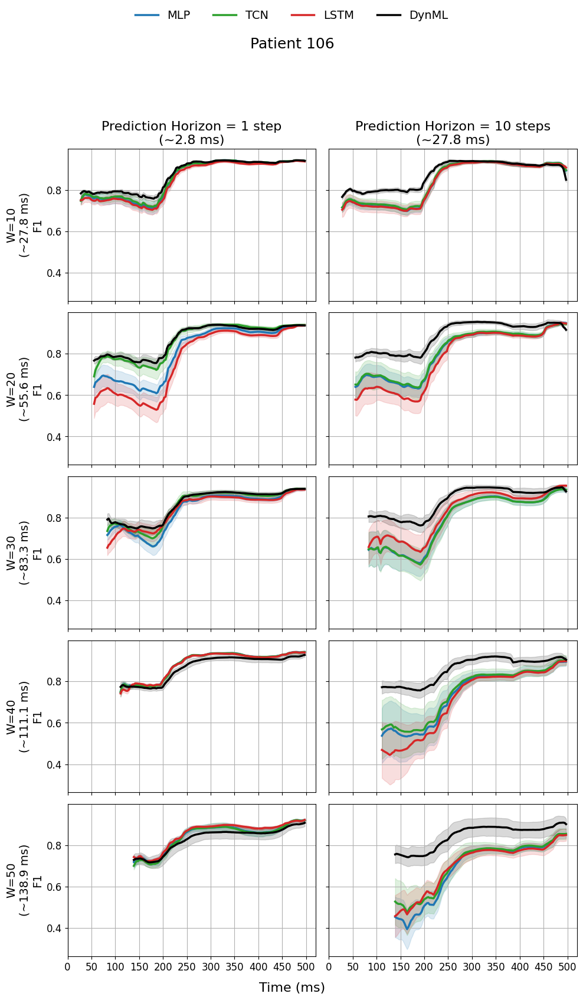

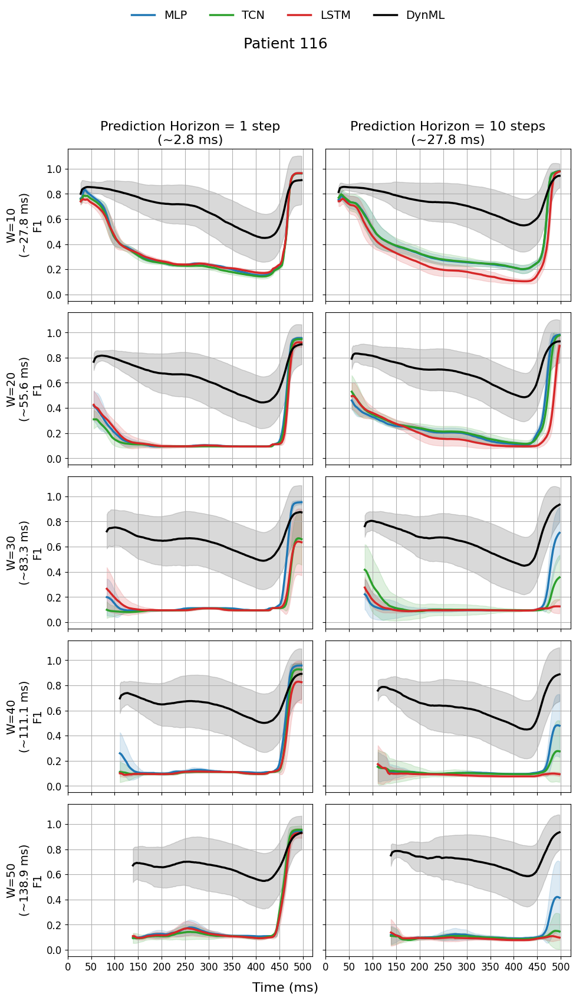

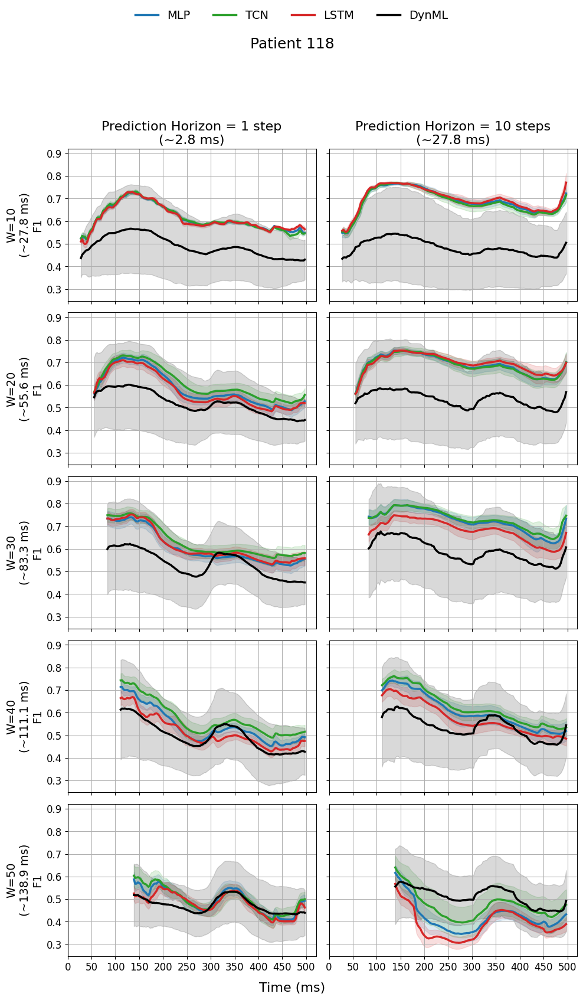

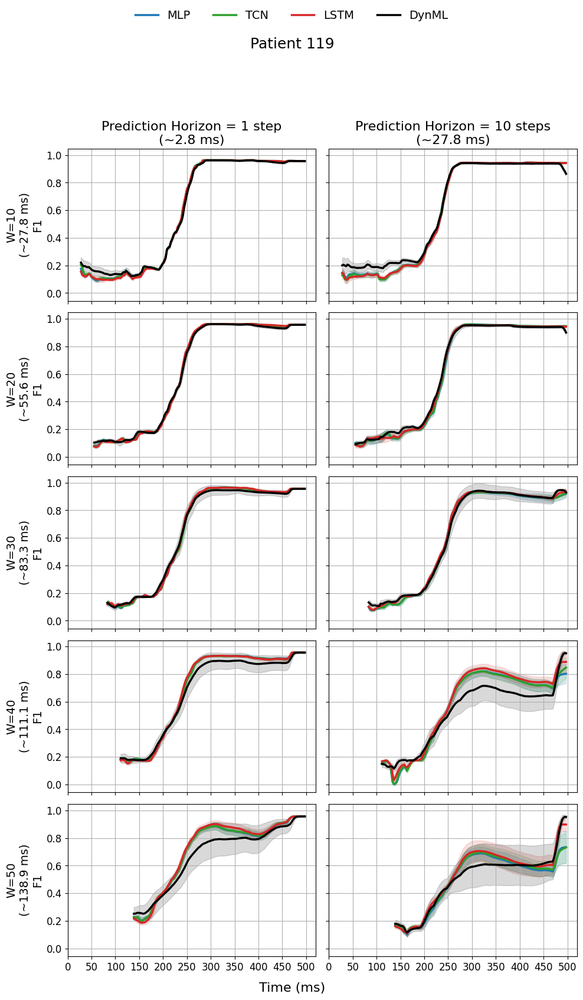

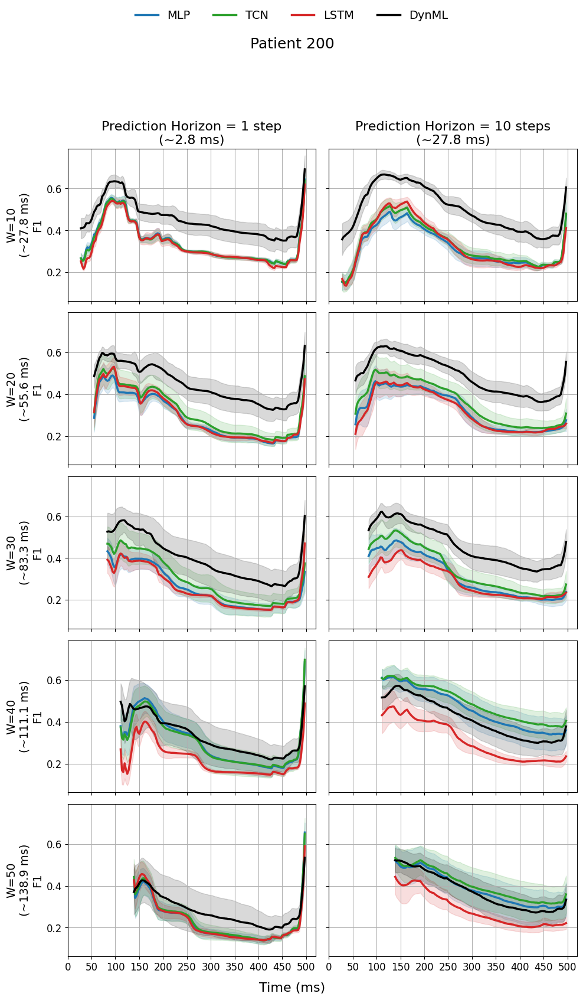

...

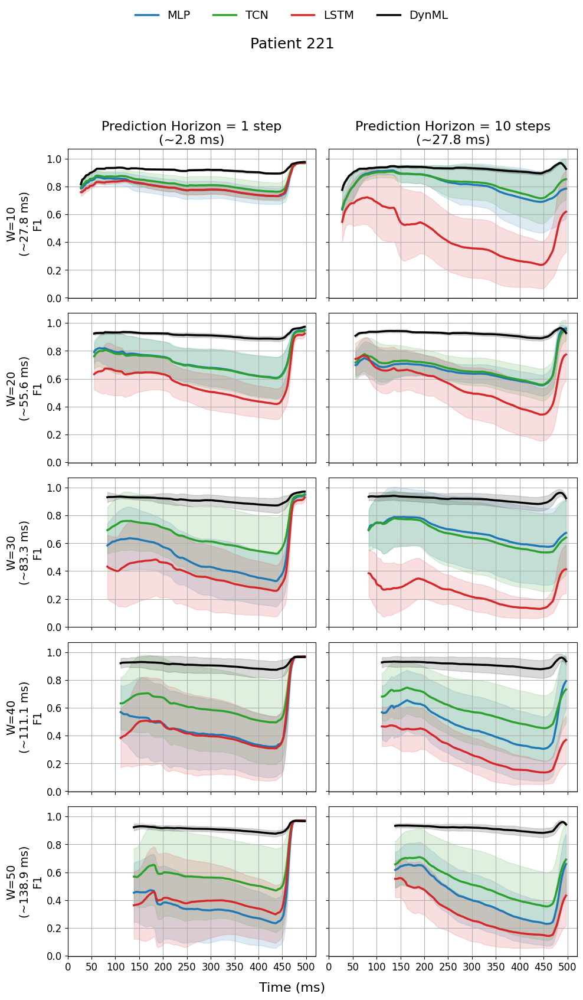

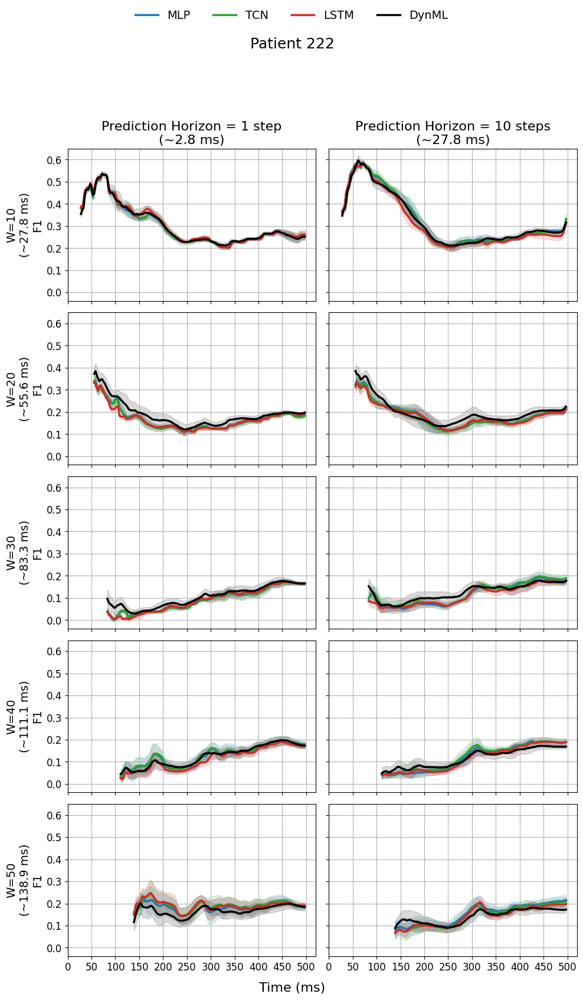

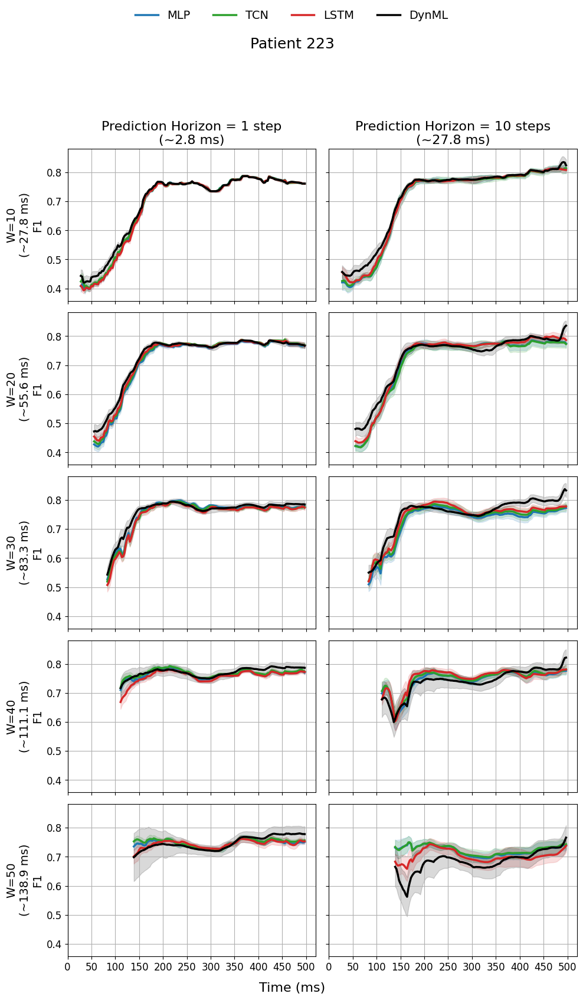

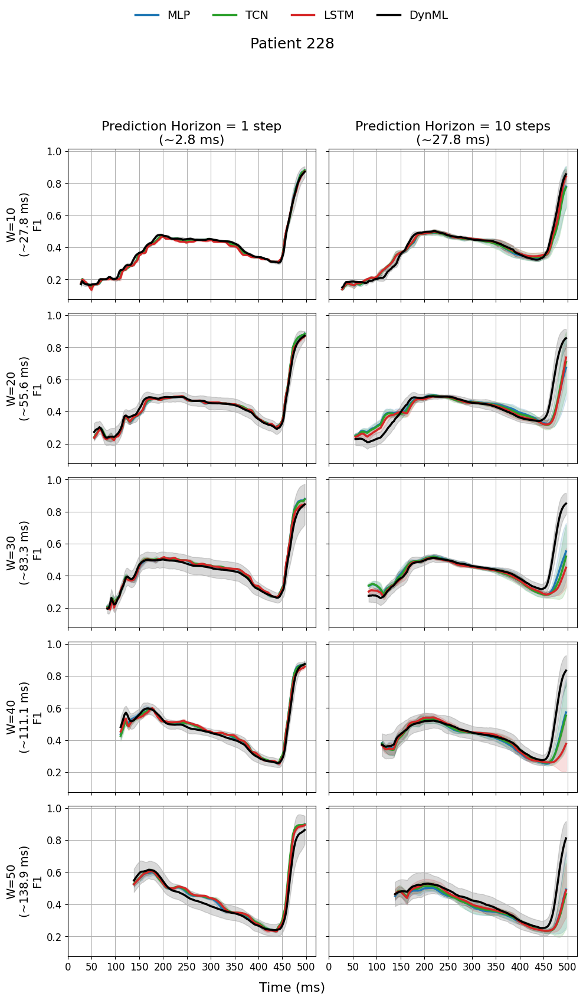

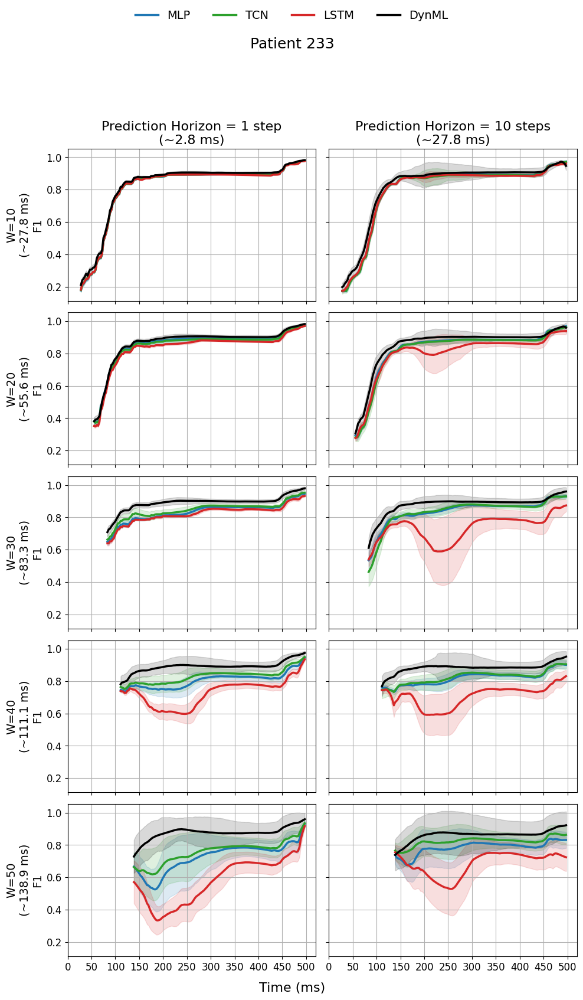

In [19]:
# Plot each patient separately

def plot_per_patient(df_pred1, df_pred10):

    os.makedirs("multimethods_figures", exist_ok=True)

    x_max_ms = 500  # adjust if needed
    x_ticks_ms = np.arange(0, x_max_ms + 1, 50)

    for patient in patients:

        fig, axes = plt.subplots(
            nrows=len(windows_list),
            ncols=2,
            figsize=(10, 3.5 * len(windows_list)),
            sharex=True,
            sharey=True
        )

        if len(windows_list) == 1:
            axes = np.expand_dims(axes, axis=0)

        for r, W in enumerate(windows_list):

            for c, (df_use, pred_label) in enumerate([
                (df_pred1, "Prediction Horizon = 1 step\n(~2.8 ms)"),
                (df_pred10, "Prediction Horizon = 10 steps\n(~27.8 ms)")
            ]):

                ax = axes[r][c]

                df_pw = df_use[
                    (df_use["Patient"] == patient) &
                    (df_use["input_len"] == W)
                ]

                for method in methods:

                    df_m = df_pw[df_pw["Method"] == method]
                    if df_m.empty:
                        continue

                    mat = extract_f1_matrix(df_m)
                    if mat is None:
                        continue

                    mean = mat.mean(axis=0)
                    std  = mat.std(axis=0)

                    x_axis = (np.arange(len(mean)) + W) * dt_ms

                    ax.plot(x_axis, mean, color=colors[method], linewidth=2.5, label=method)
                    ax.fill_between(x_axis, mean-std, mean+std,
                                    color=colors[method], alpha=0.15)

                # ---------------- formatting ----------------
                if r == 0:
                    ax.set_title(pred_label, fontsize=16)

                if c == 0:
                    W_ms = W * dt_ms
                    ax.set_ylabel(f"W={W}\n(~{W_ms:.1f} ms)\nF1", fontsize=14)

                ax.grid(True)
                ax.tick_params(axis='both', labelsize=12)

                ax.set_xticks(x_ticks_ms)

        # ---------------- legend ----------------
        handles = [plt.Line2D([0], [0], color=colors[m], lw=2.5) for m in methods]

        fig.legend(handles, methods,
                   loc="upper center",
                   ncol=len(methods),
                   fontsize=14,
                   frameon=False)

        fig.suptitle(f"\nPatient {patient}", fontsize=18)
        fig.text(0.5, 0.04, "Time (ms)", ha='center', fontsize=16)

        plt.tight_layout(rect=[0, 0.05, 1, 0.93])

        # SAVE
        filename = f"methods_comparison_w1_10_patient_{patient}.png"
        plt.savefig(f"multimethods_figures/{filename}", dpi=300, bbox_inches='tight')

        plt.show()

# ==========================================================
# PLOT
# ==========================================================
plot_per_patient(df_pred1, df_pred10)



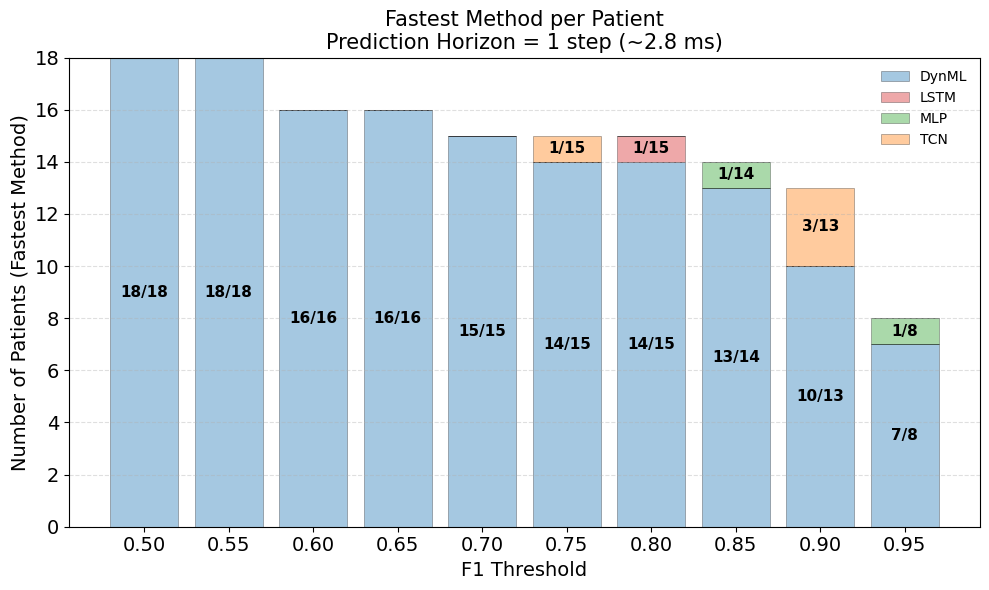

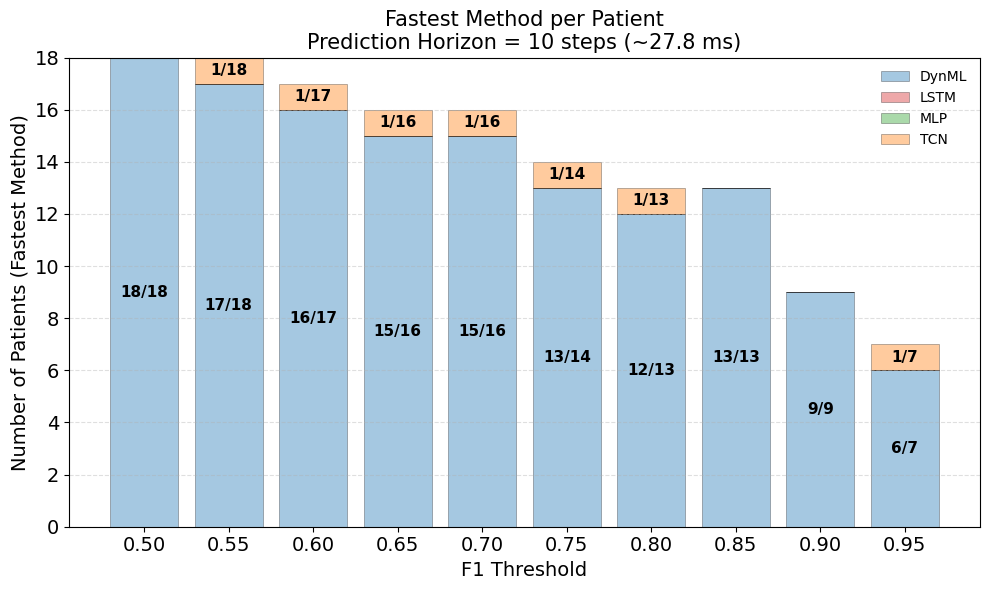

In [6]:
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt

dt_ms = 1000 / 360
thresholds = np.arange(0.5, 0.96, 0.05)

methods = sorted(df_all["Method"].unique())
patients = sorted(df_all["Patient"].unique())

# ==========================================================
# SPLIT BY PREDICTION LENGTH
# ==========================================================
df_pred1  = df_all[df_all["Pred_len"] == 1]
df_pred10 = df_all[df_all["Pred_len"] == 10]

# ==========================================================
# FUNCTION: STACKED BAR (FASTEST METHOD COUNT)
# ==========================================================
def plot_fastest_method_bar(df_in, title):

    records = []

    # -------------------------
    # STEP 1: compute time-to-threshold per row
    # -------------------------
    for _, row in df_in.iterrows():

        method = str(row["Method"]).strip()
        patient = row["Patient"]

        try:
            results = json.loads(row["Online_results"])
            f1 = np.array([r["f1"] for r in results])
        except:
            continue

        time_axis = np.arange(len(f1)) * dt_ms

        for tau in thresholds:

            idx = np.where(f1 >= tau)[0]

            if len(idx) > 0:
                t_reach = time_axis[idx[0]]
            else:
                t_reach = np.nan

            records.append({
                "Method": method,
                "Patient": patient,
                "Threshold": tau,
                "TimeToReach": t_reach
            })

    df_thr = pd.DataFrame(records)

    # -------------------------
    # STEP 2: find fastest method per patient & threshold
    # -------------------------
    winners = []

    for patient in patients:
        for tau in thresholds:

            d = df_thr[
                (df_thr["Patient"] == patient) &
                (df_thr["Threshold"] == tau)
            ].dropna(subset=["TimeToReach"])

            if d.empty:
                continue

            # get method with minimum time
            best_row = d.loc[d["TimeToReach"].idxmin()]

            winners.append({
                "Threshold": tau,
                "Method": best_row["Method"]
            })

    df_win = pd.DataFrame(winners)

    # -------------------------
    # STEP 3: count winners
    # -------------------------
    counts = df_win.groupby(["Threshold", "Method"]).size().unstack(fill_value=0)

    # ensure all methods present
    for m in methods:
        if m not in counts.columns:
            counts[m] = 0

    counts = counts[methods]  # consistent order

    # -------------------------
    # STEP 4: stacked bar plot (IMPROVED VISUALS)
    # -------------------------
    x = np.arange(len(counts.index))
    
    plt.figure(figsize=(10, 6))
    
    bottom = np.zeros(len(counts))

    # distinct, colorblind-friendly palette (high contrast)
    color_map = [
        "#1f77b4",  # blue
        "#d62728",  # red
        "#2ca02c",  # green
        "#ff7f0e"   # orange
    ]

    # total patients who reached each threshold
    total_per_threshold = counts.sum(axis=1).values
    
    for method, color in zip(methods, color_map):
    
        values = counts[method].values
    
        bars = plt.bar(
            x,
            values,
            bottom=bottom,
            label=method,
            color=color,
            edgecolor='black',   # improves visibility
            linewidth=0.5,
            alpha=0.4
        )
    
        # -------------------------
        # ADD TEXT INSIDE BARS
        # -------------------------
        for i, (bar, val, total) in enumerate(zip(bars, values, total_per_threshold)):
    
            if val > 0:
    
                # choose text color based on bar height (contrast trick)
                # text_color = 'black' if val < max(total_per_threshold)*0.6 else 'white'
                text_color = 'black'
    
                plt.text(
                    bar.get_x() + bar.get_width()/2,
                    bottom[i] + val/2,
                    f"{int(val)}/{int(total)}",
                    ha='center',
                    va='center',
                    fontsize=11,
                    color=text_color,
                    fontweight='bold'
                )
    
        bottom += values
    
    plt.xticks(x, [f"{t:.2f}" for t in counts.index])
    plt.tick_params(axis='both', labelsize=14)
    
    plt.xlabel("F1 Threshold", fontsize=14)
    plt.ylabel("Number of Patients (Fastest Method)", fontsize=14)
    plt.title(title, fontsize=15)
    
    plt.legend(frameon=False)  # cleaner legend
    plt.grid(axis='y', linestyle='--', alpha=0.4)
    
    plt.tight_layout()

    # SAVE FIGURE
    filename = title.replace("\n", "_").replace(" ", "_").replace("(", "").replace(")", "").replace("=", "")
    plt.savefig(f"multimethods_figures/{filename}.png", dpi=300, bbox_inches='tight')
    
    plt.show()

# ==========================================================
# PLOT TWO FIGURES
# ==========================================================
plot_fastest_method_bar(
    df_pred1,
    "Fastest Method per Patient\nPrediction Horizon = 1 step (~2.8 ms)"
)

plot_fastest_method_bar(
    df_pred10,
    "Fastest Method per Patient\nPrediction Horizon = 10 steps (~27.8 ms)"
)


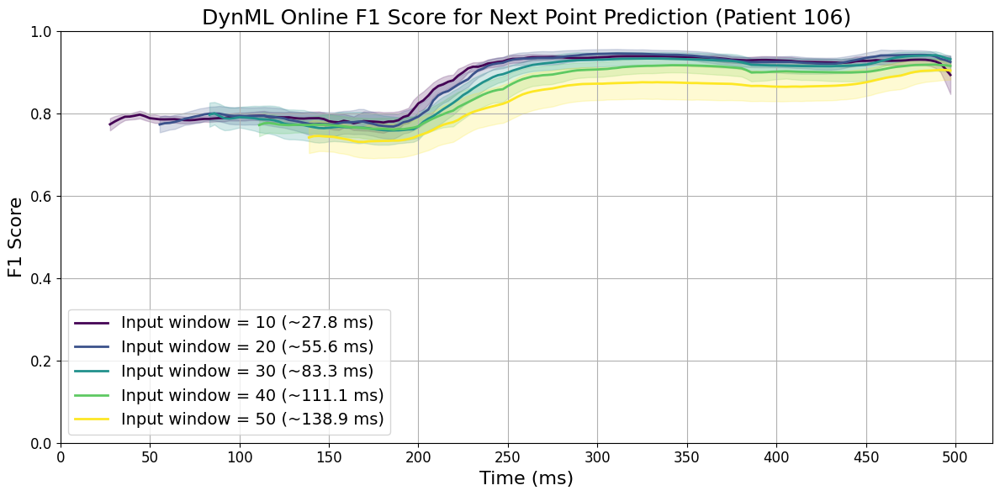

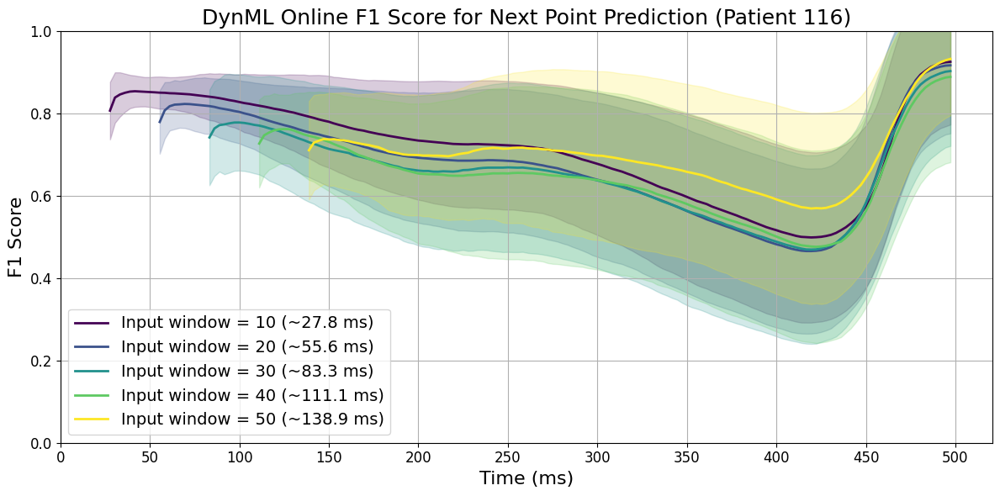

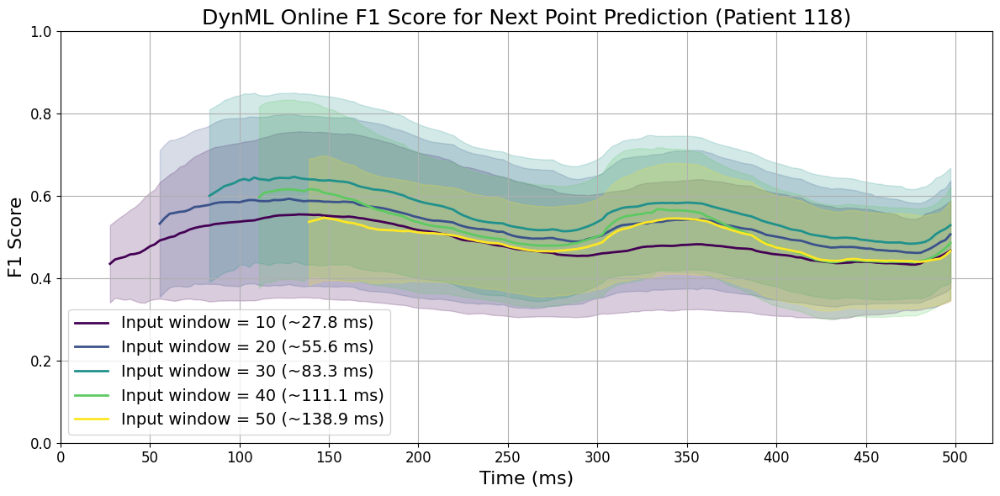

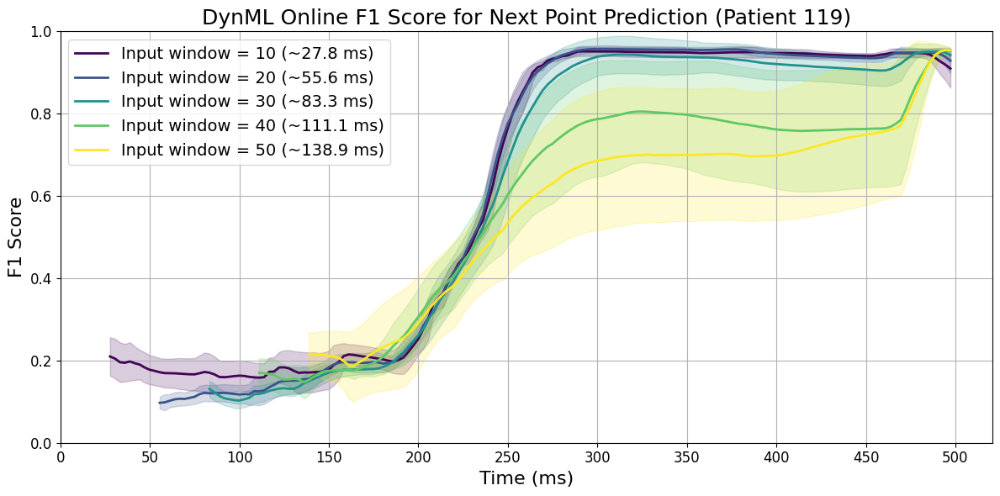

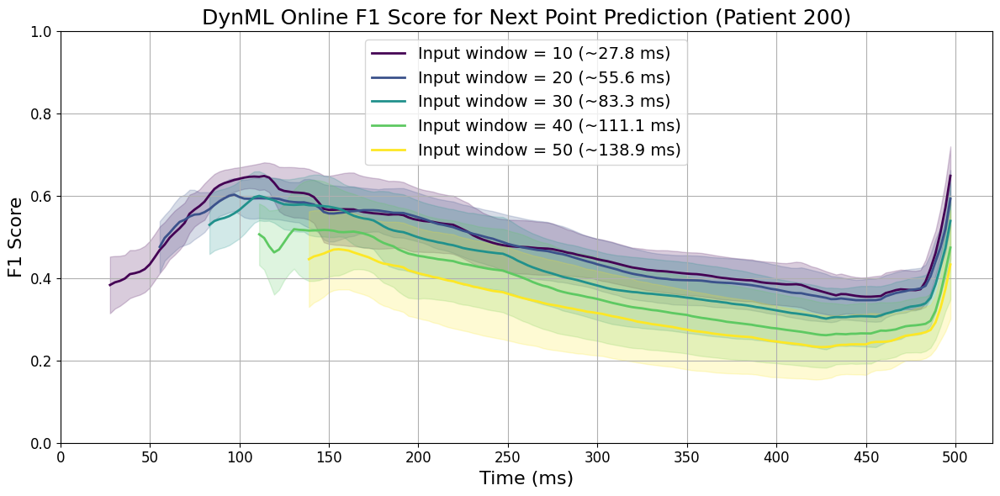

...

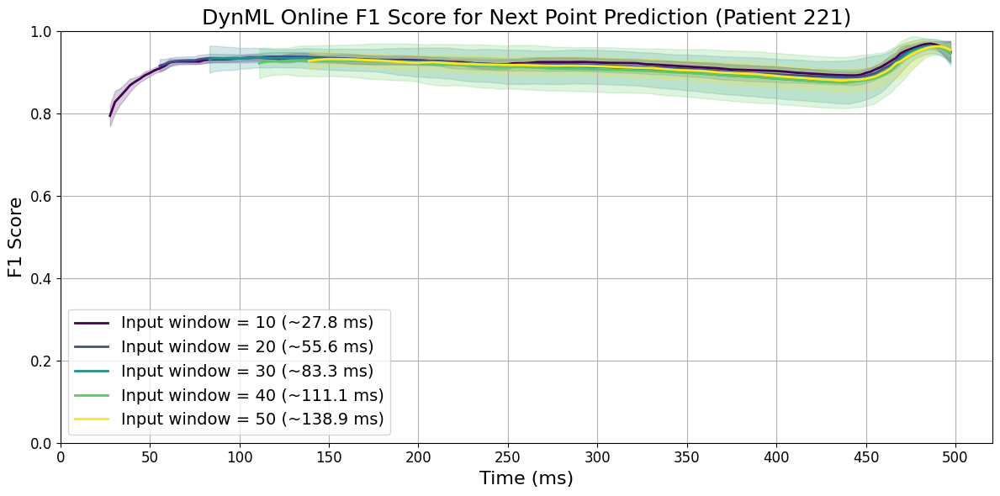

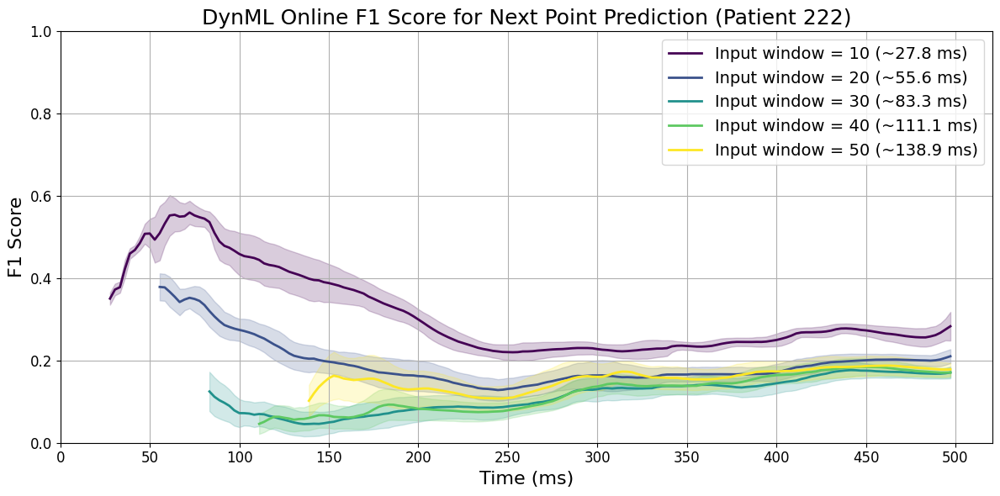

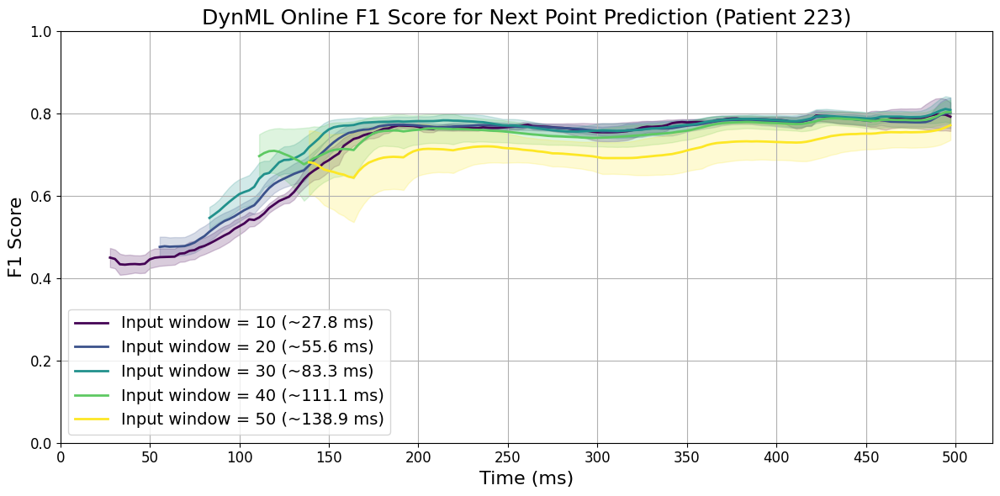

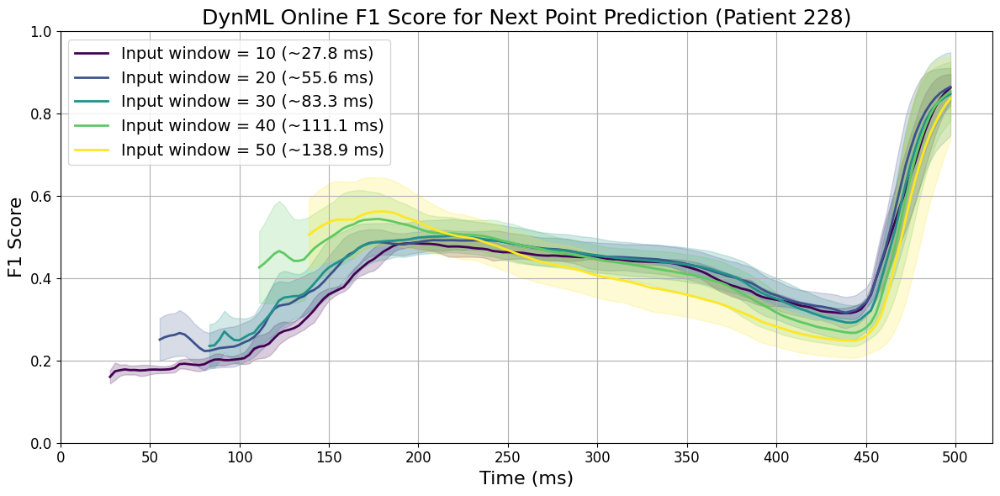

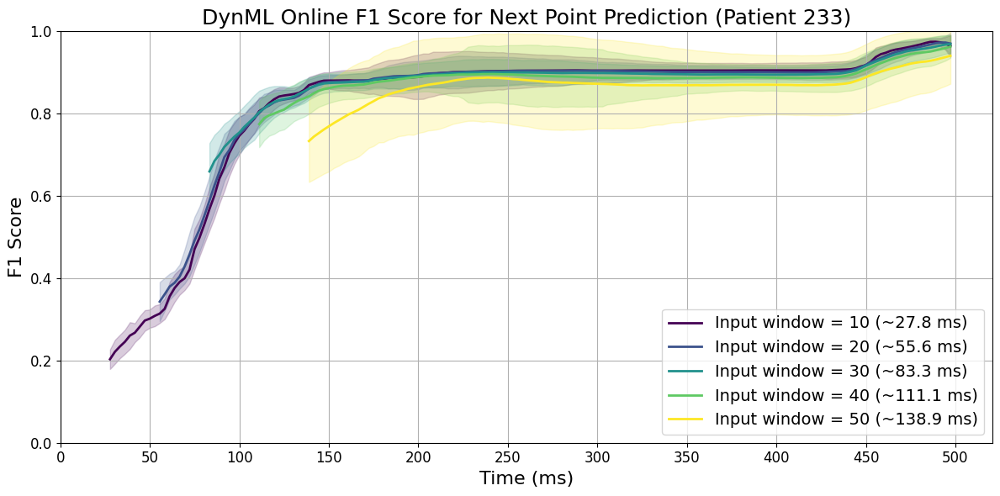

In [24]:
import matplotlib.pyplot as plt
import numpy as np
import json
import os

# ==========================================================
# PARAMETERS
# ==========================================================
method = "DynML"
output_index = 0
dt_ms = 1000 / 360

patients = sorted(df_all["Patient"].unique())
windows = sorted(df_all["input_len"].unique())

colors = plt.cm.viridis(np.linspace(0, 1, len(windows)))

os.makedirs("dynml_patient_figs", exist_ok=True)

# ==========================================================
# LOOP OVER PATIENTS
# ==========================================================
for patient in patients:

    fig, ax = plt.subplots(figsize=(12, 6))

    x_max_ms = 500  # adjust if needed
    x_ticks_ms = np.arange(0, x_max_ms + 1, 50)

    # ======================================================
    # LOOP OVER WINDOWS (SAME AS YOUR ORIGINAL CODE)
    # ======================================================
    for i, W in enumerate(windows):

        df_pw = df_all[
            (df_all["Patient"] == patient) &
            (df_all["input_len"] == W) &
            (df_all["Method"] == method)
        ]

        if df_pw.empty:
            continue

        f1_matrix = []

        for _, row in df_pw.iterrows():

            res = json.loads(row["Online_results"])

            f1_vec = [
                r["f1"][output_index] if isinstance(r["f1"], list)
                else r["f1"]
                for r in res
            ]

            f1_matrix.append(f1_vec)

        f1_matrix = np.array(f1_matrix)

        if f1_matrix.size == 0:
            continue

        f1_mean = f1_matrix.mean(axis=0)
        f1_std  = f1_matrix.std(axis=0)

        x_axis = (np.arange(len(f1_mean)) + W) * dt_ms

        ax.plot(
            x_axis,
            f1_mean,
            color=colors[i],
            linewidth=2,
            label=f"Input window = {W} (~{W*dt_ms:.1f} ms)"
        )

        ax.fill_between(
            x_axis,
            f1_mean - f1_std,
            f1_mean + f1_std,
            color=colors[i],
            alpha=0.2
        )

    # ======================================================
    # FORMATTING (same style as your original)
    # ======================================================
    ax.set_xlabel("Time (ms)", fontsize=16)
    ax.set_ylabel("F1 Score", fontsize=16)

    ax.set_ylim(0.0, 1.0)
    ax.set_yticks(np.arange(0.0, 1.1, 0.2))
    ax.set_xticks(x_ticks_ms)

    ax.grid(True)
    ax.legend(fontsize=14)

    ax.tick_params(axis="x", labelsize=12)
    ax.tick_params(axis="y", labelsize=12)

    plt.title(
        f"DynML Online F1 Score for Next Point Prediction (Patient {patient})",
        fontsize=18
    )

    plt.tight_layout()

    # ======================================================
    # SAVE FIGURE
    # ======================================================
    fig.savefig(
        f"dynml_patient_figs/Fig_online_F1_dynml_patient_{patient}.png",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()